In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import joblib

## Downloading locally
- The easiest way to install diad fit is by removing the #, and running this once per computer. When I update the code, you'll need to get the new tag off GitHub:
https://github.com/PennyWieser/DiadFit/tags
Right click on the top one, over the 'zip' icon, click copy link address
- If youve already done this for Ne, you dont need to do here too

In [2]:
#!pip install --upgrade "https://github.com/PennyWieser/DiadFit/archive/refs/tags/0.0.11.zip"

### This imports DiadFit, and gives you the version. In all communication with Penny, make sure you say the version!


In [3]:
import DiadFit as pf
pf.__version__

'0.0.36'

In [4]:
DayFolder=r'G:\My Drive\Berkeley_NEW\DiadFit_outer\docs\Examples\Diad_Fitting_Nov22nd2022'
meta_path=DayFolder +  '\MetaData'
spectra_path=DayFolder + '\Spectra'

In [5]:
# This specifies what file type your Raman exported in. 
filetype='headless_txt' # Specifies raman file format 
file_ext='.txt'
prefix=False

## Now load the files of interest

In [6]:
Diad_Files_Weak = joblib.load('Diad_Files_Grp2.sav')

In [7]:
Diad_Files_Weak

['POC39.txt',
 'POC30.txt',
 'POC38.txt',
 'POC20.txt',
 'POC29.txt',
 'POC37.txt',
 'POC19.txt',
 'POC25.txt',
 'POC26.txt',
 'POC24.txt',
 'POC23.txt',
 'POC28.txt',
 'POC18.txt',
 'POC22.txt',
 'POC27.txt',
 'POC21.txt',
 'POC36.txt',
 'POC17.txt',
 'POC35.txt',
 'POC11.txt',
 'POC16.txt',
 'POC15.txt',
 'POC34.txt',
 'POC10.txt',
 'POC9.txt',
 'POC14.txt',
 'POC13.txt',
 'POC33.txt',
 'POC12.txt',
 'POC32.txt',
 'POC31.txt']

In [8]:
# Select one file to tweak fit on
filename_Weak='POC25.txt' #Diad_Files_Weak[1]
filename_Weak

'POC25.txt'

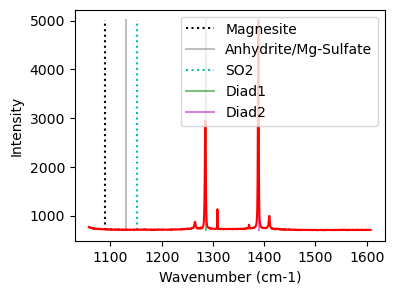

In [9]:
plot1=pf.plot_diad(path=spectra_path, filename=filename_Weak, filetype=filetype)

## Decide if you want a secondary peak
- If you dont have the peak, it is only a little slower, but it works if it only appears in a small number of spectra still

In [10]:
# Decide if you want to fit a carbonate peak or not here. 
fit_sec_peak=False

if fit_sec_peak is True:

    # Tweak options here, can exclude a range for example using exclude_range=Tuple[float, float]
    generic_Config=pf.generic_peak_config(lower_bck=(1110, 1130), 
    upper_bck=(1160, 1180), cent_generic=1150, name='SO2')

    generic_fit=pf.fit_generic_peak(config=generic_Config, path=spectra_path, 
    filename=filename_Weak, filetype=filetype)
    generic_fit

## Now lets inspect the diads and get their approximate positions
- As with generic peak, you can exclude 2 segments (e.g. around cosmic rays)
- You then specify how many peaks you want to fit on each diad. 1 means just the strong peak, 2 hotbands, and 3 for Diad2 would also fit the C13 peak if present. 
- The identify_diad_peaks then uses scipy findpeaks to identify the positions of the 2 diads, and any other peaks the user asks for. These are saved, and fed into the later functions for peak fitting. 

In [11]:
diad_id_config=pf.diad_id_config(height=50, exclude_range1=[1308, 1309])
diad_id_config

diad_id_config(exclude_range1=[1308, 1309], exclude_range2=None, approx_diad2_pos=(1379, 1395), approx_diad1_pos=(1275, 1295), Diad2_window=(1349, 1425), Diad1_window=(1245, 1325), approx_diad2_pos_3peaks=(1379, 1395, 1362), height=50, distance=5, threshold=0.5, width=0.5, prominence=10, plot_figure=True)

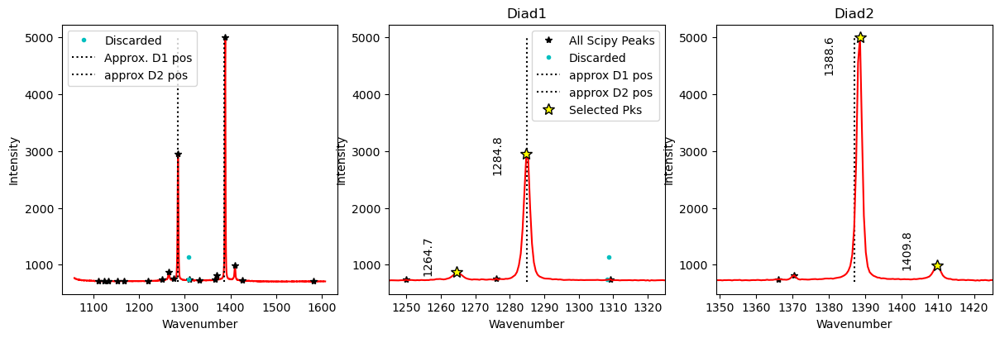

In [12]:
# Specify the number of peaks, 1 = just peak, 2 = Peak+hot bands
n_peaks_diad1=2
n_peaks_diad2=2
    
diad1_peaks, diad2_peaks=pf.identify_diad_peaks(
    config=diad_id_config, path=spectra_path, filename=filename_Weak,
filetype=filetype, n_peaks_diad1=n_peaks_diad1, n_peaks_diad2=n_peaks_diad2)

In [13]:
Diad_df=pf.get_data(path=spectra_path, filename=filename_Weak, filetype='headless_txt')

In [14]:
## Choose a model - option, pseudovoigt or voigt
model_name='PseudoVoigtModel'

## Fit Diad 1
- You can tweak the parameters in diad1_fit_config

In [15]:
diad1_fit_config_init=pf.diad1_fit_config(model_name=model_name,
N_poly_bck_diad1=2, lower_bck_diad1=(1180, 1220),
diad_sigma=0.6, diad_sigma_min_allowance=0.5, diad_sigma_max_allowance=2,
y_range_baseline=200,
x_range_residual=10, x_range_baseline=30, HB_amplitude=5, diad_amplitude=1000)
diad1_fit_config_init

diad1_fit_config(model_name='PseudoVoigtModel', peak_pos_gauss=None, gauss_sigma=1, gauss_amp=3000, diad_sigma=0.6, diad_sigma_min_allowance=0.5, diad_sigma_max_allowance=2, N_poly_bck_diad1=2, lower_bck_diad1=(1180, 1220), upper_bck_diad1=(1300, 1350), diad_amplitude=1000, HB_amplitude=5, x_range_baseline=30, y_range_baseline=200, plot_figure=True, dpi=200, x_range_residual=10, return_other_params=False)

,Diad1_Combofit_Cent,Diad1_Voigt_Cent,Diad1_Voigt_Area,Diad1_Voigt_Sigma,Diad1_Voigt_Gamma,HB1_Cent,HB1_Area,HB1_Sigma,Diad1_Combofit_Height,Residual_Diad1,Diad1_Prop_Lor,Diad1_fwhm,Diad1_refit
0,1284.979609,1284.979659,6261.012429,1.036071,None,1264.828984,694.570104,1.501686,2296.665733,5.71691,0.593105,2.072143,Flagged Warnings:


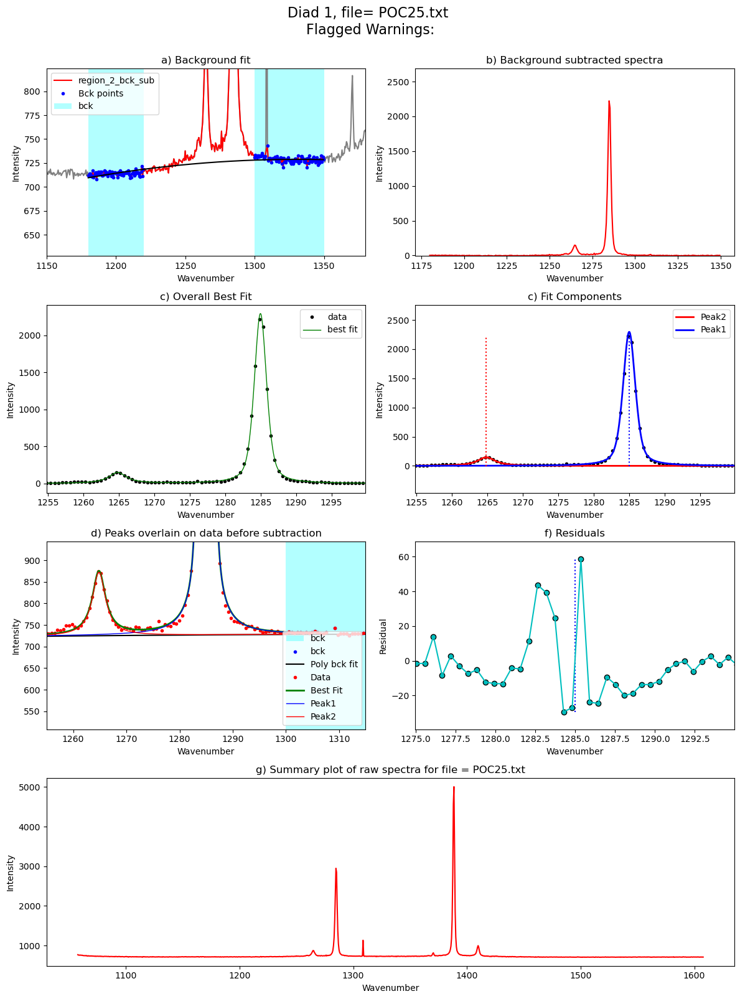

In [16]:
Diad1_fit=pf.fit_diad_1_w_bck(config1=diad1_fit_config_init,
config2=diad_id_config, peak_pos_voigt=diad1_peaks,
path=spectra_path, filename=filename_Weak, filetype=filetype, close_figure=False)
Diad1_fit

In [17]:
### Now lets update the tweakable parameters with the sigma values
diad1_fit_config=diad1_fit_config_init
diad1_fit_config.diad_sigma=Diad1_fit['Diad1_Voigt_Sigma'][0]
diad1_fit_config.diad_amplitude=Diad1_fit['Diad1_Voigt_Area'][0]
diad1_fit_config.HB_amplitude=Diad1_fit['HB1_Area'][0]
diad1_fit_config.diad_sigma_min_allowance=0.5
diad1_fit_config.diad_sigma_max_allowance=2
diad1_fit_config

diad1_fit_config(model_name='PseudoVoigtModel', peak_pos_gauss=None, gauss_sigma=1, gauss_amp=3000, diad_sigma=1.0360713801392287, diad_sigma_min_allowance=0.5, diad_sigma_max_allowance=2, N_poly_bck_diad1=2, lower_bck_diad1=(1180, 1220), upper_bck_diad1=(1300, 1350), diad_amplitude=6261.012429446273, HB_amplitude=694.5701042861175, x_range_baseline=30, y_range_baseline=200, plot_figure=True, dpi=200, x_range_residual=10, return_other_params=False)

## Fit diad 2

In [18]:
diad2_fit_config_init=pf.diad2_fit_config(model_name=model_name,
diad_sigma=0.2,  N_poly_bck_diad2=2,
HB_amplitude=100,                                          
x_range_residual=10, 
diad_amplitude=6000, 
x_range_baseline=30)
diad2_fit_config_init


diad2_fit_config(model_name='PseudoVoigtModel', peak_pos_gauss=None, gauss_sigma=1, gauss_amp=3000, diad_sigma=0.2, diad_sigma_min_allowance=0.2, diad_sigma_max_allowance=5, C13_sigma=0.1, sigma_allowance=10, N_poly_bck_diad2=2, lower_bck_diad2=(1300, 1360), upper_bck_diad2=(1440, 1470), diad_amplitude=6000, HB_amplitude=100, x_range_baseline=30, y_range_baseline=100, plot_figure=True, dpi=200, x_range_residual=10, return_other_params=False)

,Diad2_Combofit_Cent,Diad2_Voigt_Cent,Diad2_Voigt_Area,Diad2_Voigt_Sigma,Diad2_Voigt_Gamma,HB2_Cent,HB2_Area,HB2_Sigma,Diad2_Combofit_Height,Residual_Diad2,Diad2_Prop_Lor,Diad2_fwhm,Diad2_refit
0,1388.406053,1388.406003,9859.410554,0.836685,None,1409.784747,1059.272003,1.239553,4442.557467,8.888262,0.612868,1.67337,Flagged Warnings:


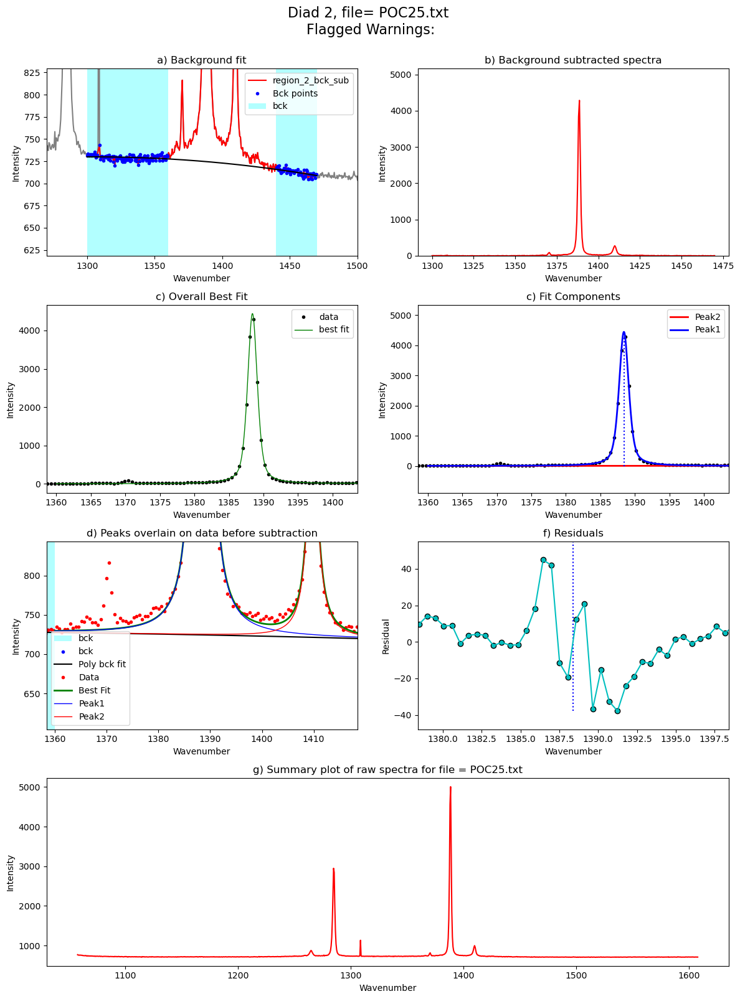

In [19]:
Diad2_fit=pf.fit_diad_2_w_bck(config1=diad2_fit_config_init,
    config2=diad_id_config, peak_pos_voigt=diad2_peaks,
path=spectra_path, filename=filename_Weak, filetype=filetype, close_figure=False)
Diad2_fit.to_clipboard(excel=True)
Diad2_fit

In [20]:
# Update param with new sigma
diad2_fit_config=diad2_fit_config_init
diad2_fit_config.diad_sigma=Diad2_fit['Diad2_Voigt_Sigma'][0]
diad2_fit_config.diad_sigma_min_allowance=0.3
diad2_fit_config.diad_sigma_max_allowance=3
diad2_fit_config.diad_amplitude=Diad2_fit['Diad2_Voigt_Area'][0]
diad2_fit_config.HB_amplitude=Diad2_fit['HB2_Area'][0]
diad2_fit_config

diad2_fit_config(model_name='PseudoVoigtModel', peak_pos_gauss=None, gauss_sigma=1, gauss_amp=3000, diad_sigma=0.836684960017626, diad_sigma_min_allowance=0.3, diad_sigma_max_allowance=3, C13_sigma=0.1, sigma_allowance=10, N_poly_bck_diad2=2, lower_bck_diad2=(1300, 1360), upper_bck_diad2=(1440, 1470), diad_amplitude=9859.410553779056, HB_amplitude=1059.2720034331765, x_range_baseline=30, y_range_baseline=100, plot_figure=True, dpi=200, x_range_residual=10, return_other_params=False)

## You can also try looping if all your spectra are pretty similar

 32%|██████████████████████████▍                                                       | 10/31 [00:19<00:45,  2.15s/it]g:\my drive\berkeley_new\diadfit_outer\src\DiadFit\diads.py:2780: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig,axes=plt.subplot_mosaic(mosaic=figure_mosaic, figsize=(12, 16))
100%|██████████████████████████████████████████████████████████████████████████████████| 31/31 [01:05<00:00,  2.12s/it]


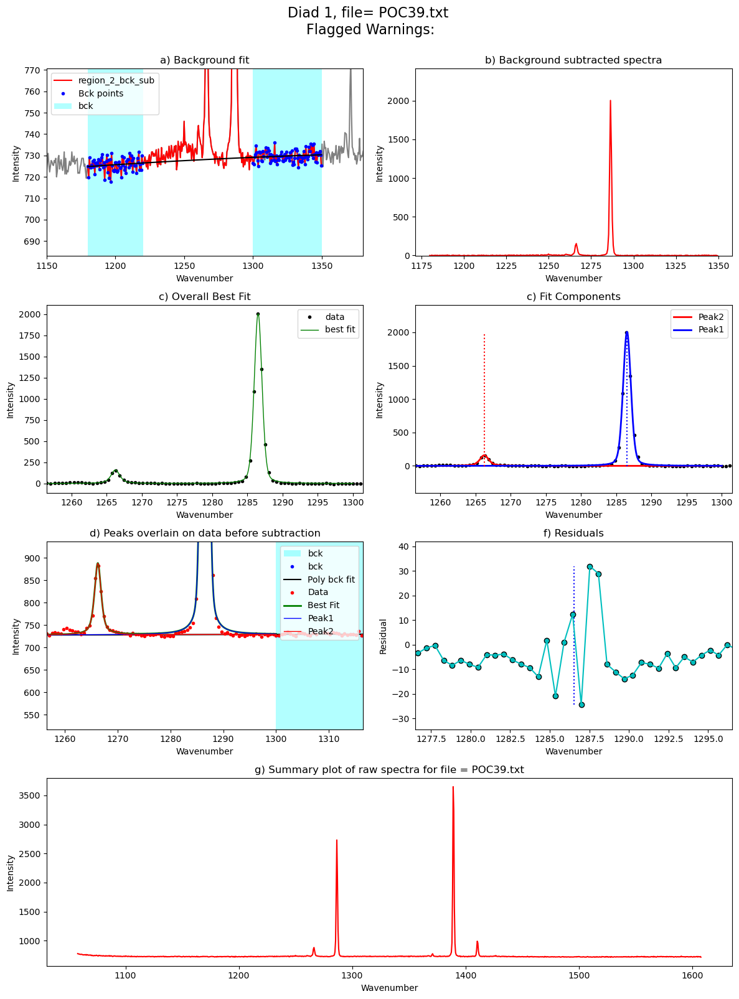

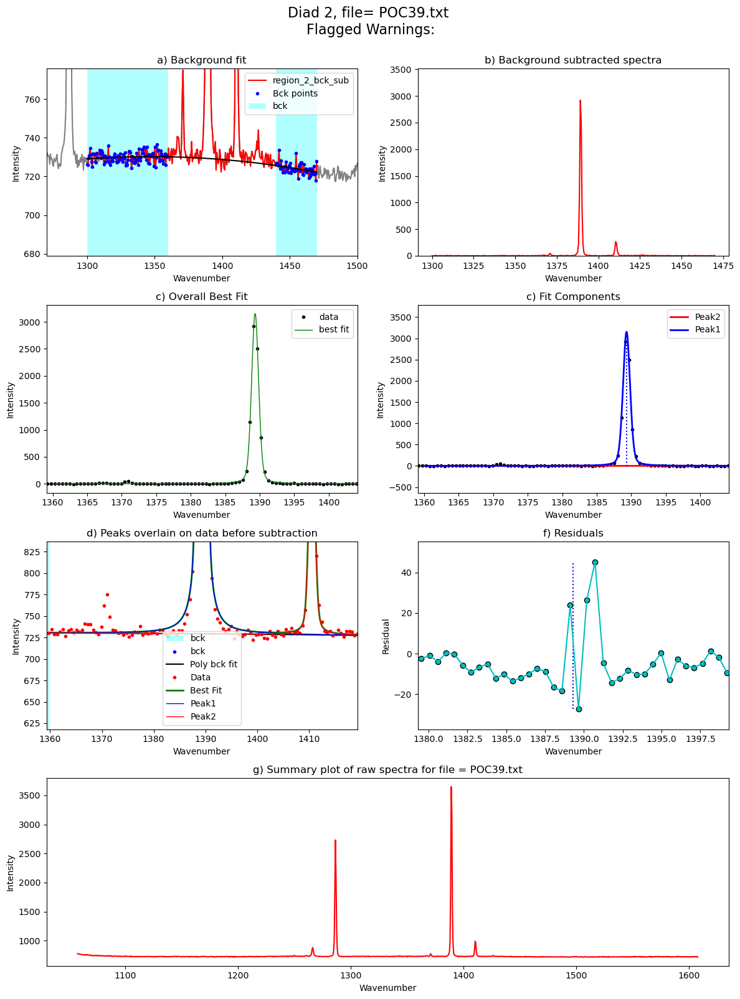

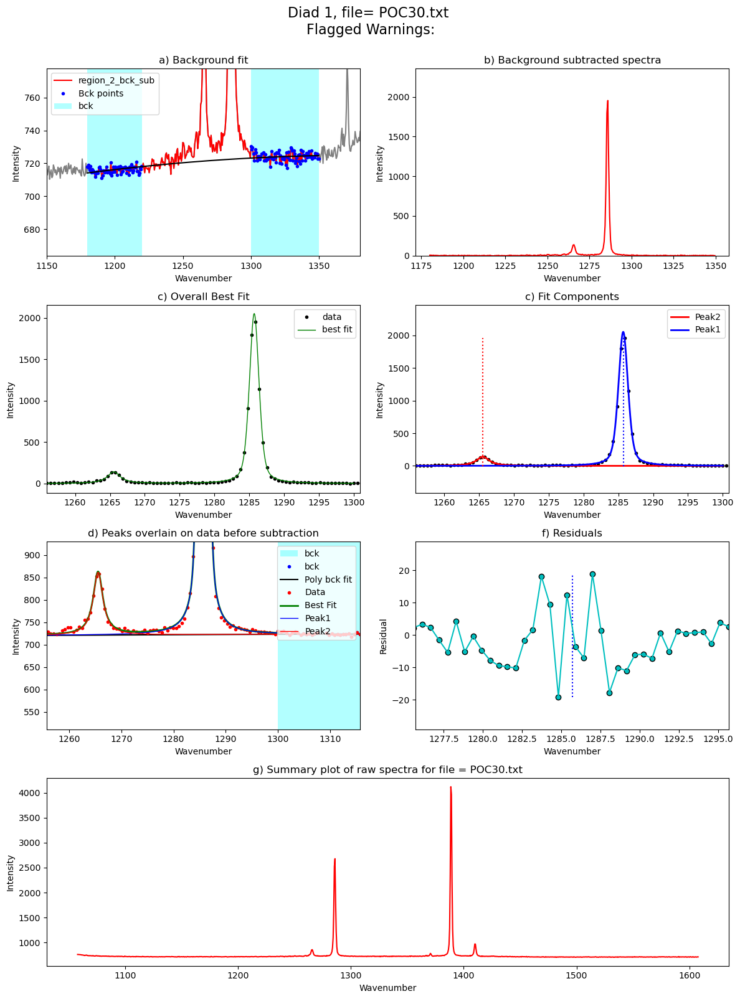

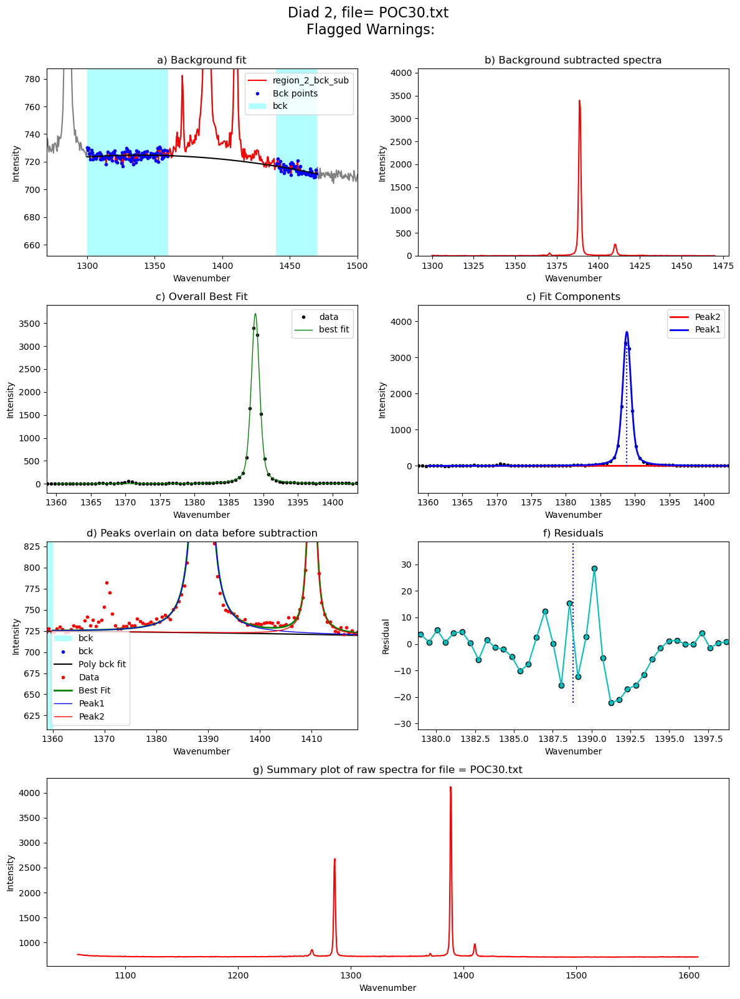

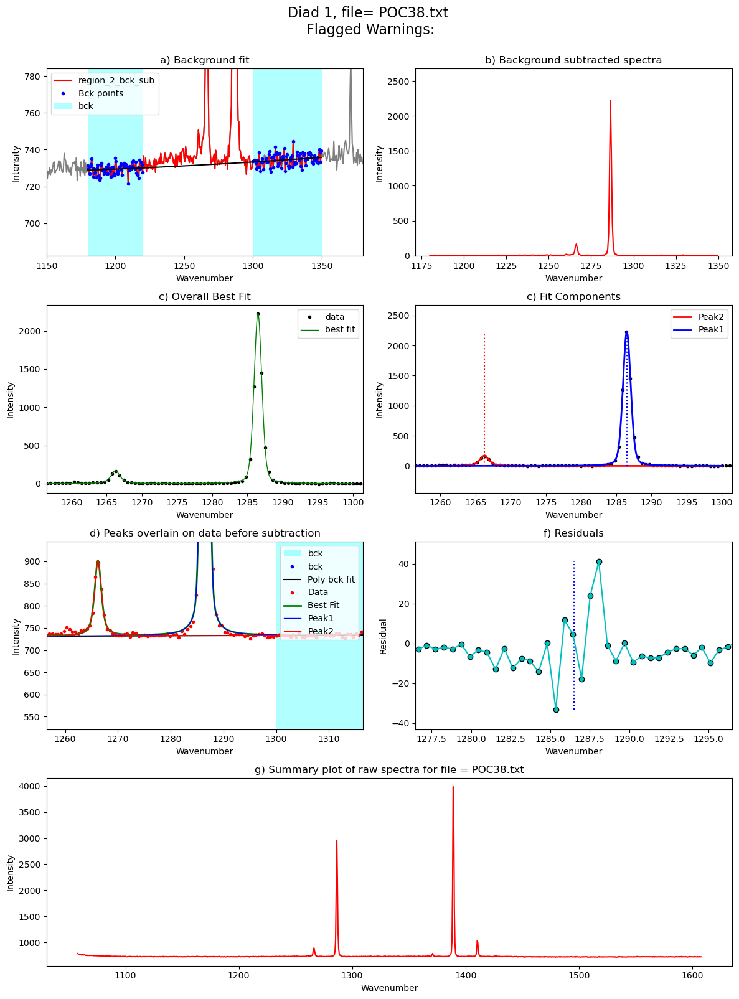

...

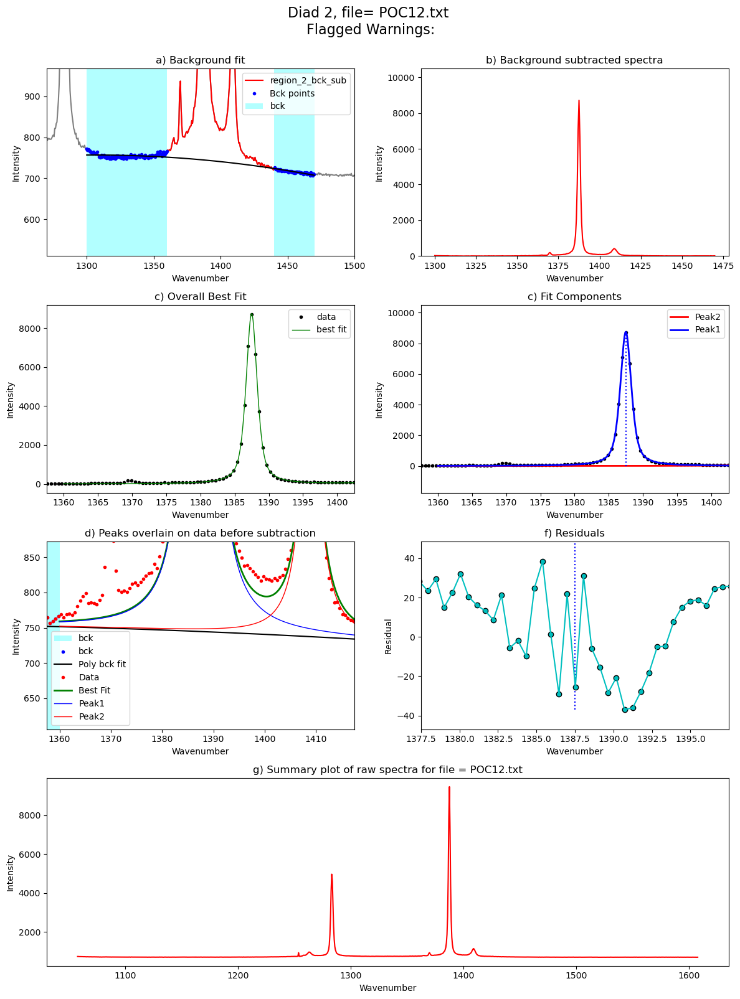

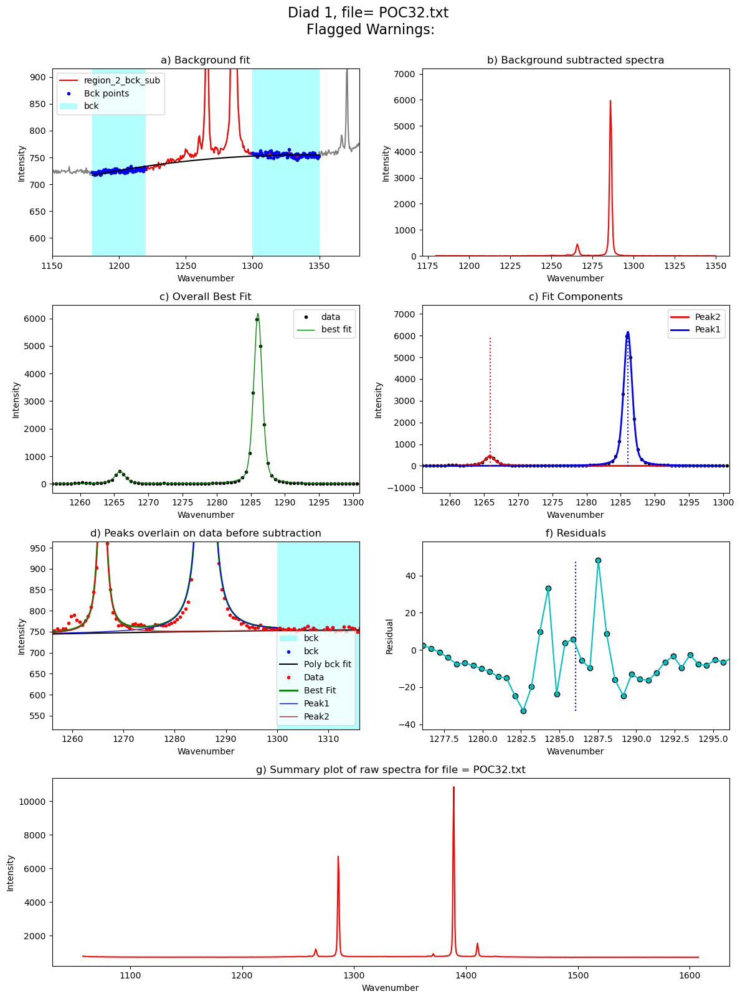

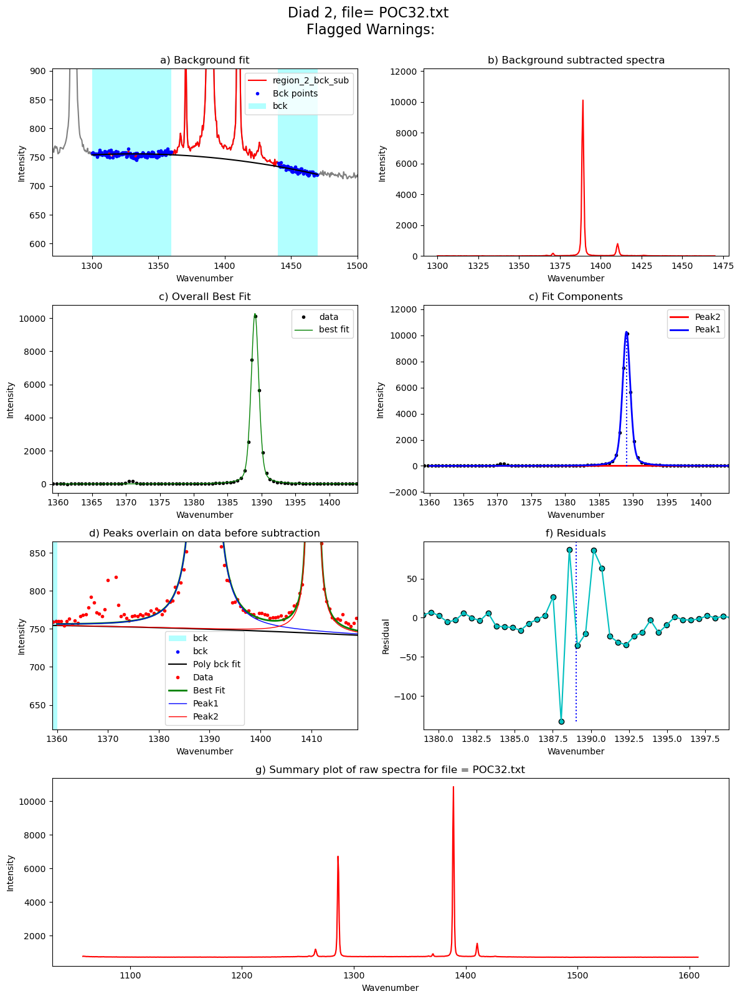

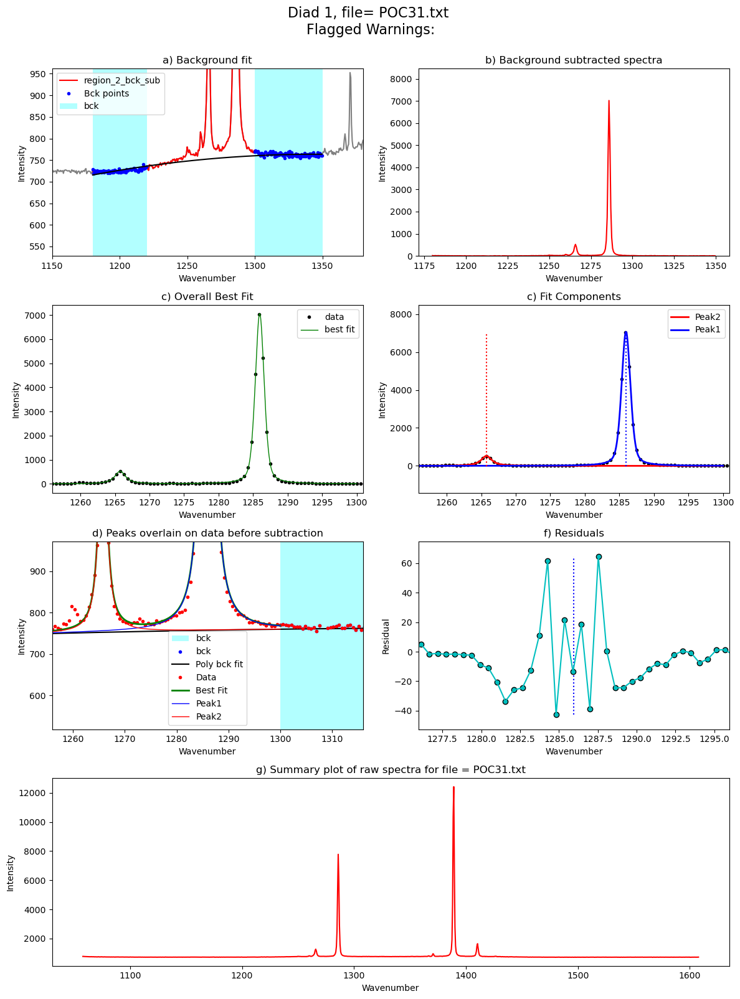

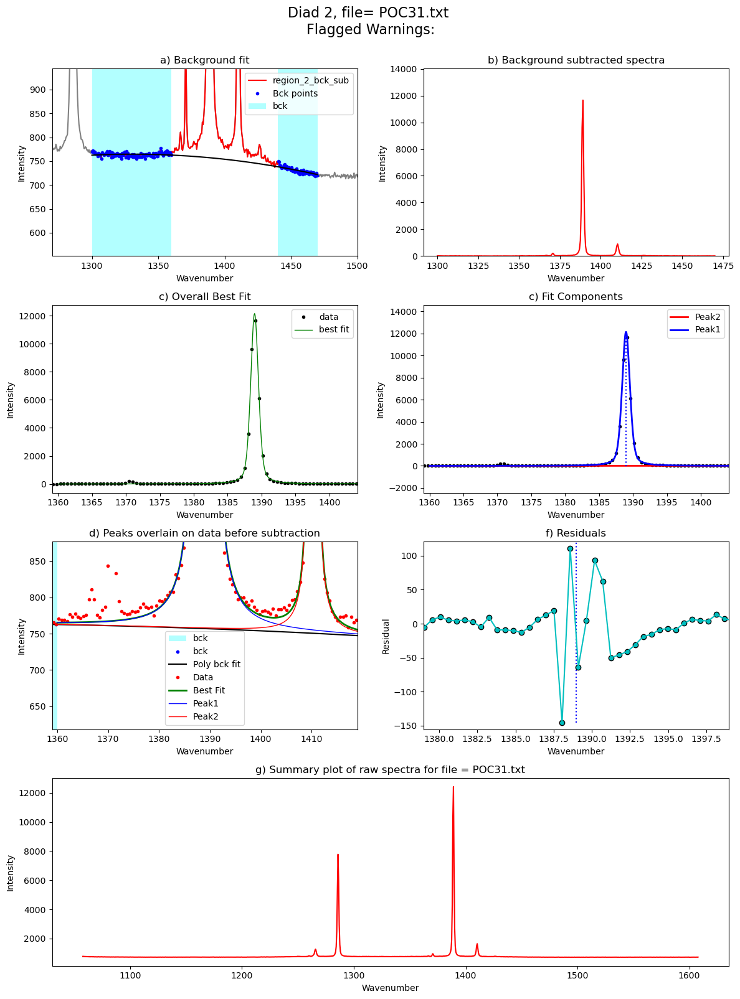

In [21]:
from tqdm import tqdm
plot_figure=False # If False, Means doesnt have to make figures, lot faster. 
close_figure=False # Means shows figures in the notebook itself
to_clipboard=False # Copies to clipboard
Diad_Files_Weak_i=Diad_Files_Weak
df_Weak = pd.DataFrame([])
for i in tqdm(range(0, len(Diad_Files_Weak))): #
    
    filename=Diad_Files_Weak[i]

    if fit_sec_peak is True:
    
        generic_fit=pf.fit_generic_peak(config=generic_Config, path=spectra_path, 
filename=filename, filetype=filetype)


    diad1_peaks, diad2_peaks=pf.identify_diad_peaks(config=diad_id_config,
            path=spectra_path, filename=filename,
filetype=filetype, n_peaks_diad1=n_peaks_diad1, 
    n_peaks_diad2=n_peaks_diad2, plot_figure=False)

    Diad1_fit=pf.fit_diad_1_w_bck(config1=diad1_fit_config,
    config2=diad_id_config, peak_pos_voigt=diad1_peaks,
path=spectra_path, filename=filename, filetype=filetype, close_figure=close_figure)

    Diad2_fit=pf.fit_diad_2_w_bck(config1=diad2_fit_config,
        config2=diad_id_config, peak_pos_voigt=diad2_peaks,
    path=spectra_path, filename=filename, filetype=filetype, close_figure=close_figure)
    
    if fit_sec_peak is True:
        data=pf.combine_diad_outputs(filename=filename, prefix=False, 
    Diad1_fit=Diad1_fit, path=spectra_path,
     to_clipboard=to_clipboard,                    
    Diad2_fit=Diad2_fit, Carb_fit=generic_fit)
        
    
    else:
        data=pf.combine_diad_outputs(filename=filename, prefix=False, 
    Diad1_fit=Diad1_fit, path=spectra_path,
     to_clipboard=to_clipboard,                    
    Diad2_fit=Diad2_fit)        
    

    df_Weak = pd.concat([df_Weak, data], axis=0)


## Here are some figures to inspect the relationship between residuals and areas etc. 

In [23]:
# These ones triggered at least one warning, so need to be refit
refit_d1=(df_Weak['Diad1_refit']==True)
refit_d2=(df_Weak['Diad2_refit']==True)
refit=refit_d1|refit_d2

In [24]:
sum(refit)

0

In [28]:
refit_names_1=df_Weak['filename'].loc[refit]
refit_names_1

for file in refit_names_1:
    img_diad1=spectra_path + '\\diad_fit_images'  + '\\Diad1_Fit_'+ str(file)  + '.png'
    img_diad2=spectra_path + '\\diad_fit_images'  + '\\Diad2_Fit_'+ str(file)  + '.png'
if sum(refit)>0:
    from IPython.display import Image
    Image(filename=img_diad1, width=500, height=1500) 
    from IPython.display import Image
    Image(filename=img_diad2, width=500, height=1500)     

In [ ]:

x='Splitting'
y1='Diad1_fwhm'
y2='Diad2_fwhm'
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,5))
ax1.plot(df_Weak[x], df_Weak[y1], 'or')
ax2.plot(df_Weak[x], df_Weak[y2], 'ob')
ax1.plot(df_Weak[x].loc[refit_d1], df_Weak[y1].loc[refit_d1], 'xk', ms=10)
ax2.plot(df_Weak[x].loc[refit_d2], df_Weak[y2].loc[refit_d2], 'xk', ms=10)
ax1.set_xlabel(x)
ax2.set_xlabel(x)
ax1.set_ylabel(y1)
ax2.set_ylabel(y2)
df_not_too_Weak=df_Weak #.loc[(df_Weak['Diad1_Voigt_Area']>25) & (df_Weak['Diad2_Voigt_Area']>30)]

In [29]:
combo=df_Weak

In [30]:
combo.to_excel('Med_Diads.xlsx')

In [ ]:
combo.to_clipboard(excel=True)

In [ ]:
combo